In [ ]:
import pandas as pd
from pandas import read_excel
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.utils import shuffle
import numpy as np
import tensorflow as tf
from scipy.stats import pearsonr
from scipy.stats import spearmanr
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import drive
import random as rd
from sklearn.decomposition import PCA
from functools import reduce
from sklearn import preprocessing
import plotly
import time
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected = True)
import plotly.graph_objs as go
import plotly.express as px

In [ ]:
drive.mount("/content/gdrive")

tf.test.gpu_device_name()

Mounted at /content/gdrive


'/device:GPU:0'

In [ ]:
location = "/content/gdrive/My Drive/Colab Notebooks/MultiModal_PD/"

In [ ]:
def my_PCA(df):

  patien_list = []
  status_list = []

  for i in range(len(df)):
    patien_list.append(df["PATNO"][i])
    status_list.append(df["STATUS"][i])

  pca_df = pd.DataFrame(columns = patien_list)
  pca_df = pca_df.replace(np.nan,0)
  pca_df.head()

  for i in df.columns[1:][:-1]:

    dicti = dict(zip(patien_list, np.zeros(len(patien_list), dtype=int)))

    for j in range(len(df)):
      dicti[patien_list[j]] = df[i][j]

    pca_df = pca_df.append(dicti, ignore_index = True)

  # pca_df.head()

  scaled_data = pca_df.T
 
  pca = PCA() # create a PCA object
  pca.fit(scaled_data) # do the math
  pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data

  per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
  labels_all = ['PC'+str(x) for x in range(1, len(per_var)+1)]
  per_var=per_var[:10]
  print(per_var)
  labels = [str(x) for x in range(1, len(per_var)+1)]

  plt.figure(figsize=(12,7))
  plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
  plt.ylabel('Percentage of Explained Variance')
  plt.xlabel('Principal Component')
  plt.title('Scree Plot for the first 10 PC')
  plt.plot(range(1,len(per_var)+1), np.cumsum(per_var),    c='red',
          label="Cumulative Explained Variance")
  plt.legend(loc='upper left')

  plt.show()

  final_df = pd.DataFrame(columns=["Patient", "PC1", "PC2", "PC3", "Status"])
  pca_computed_df = pd.DataFrame(pca_data, index=[*patien_list], columns=labels_all)

  for sample in pca_computed_df.index:
      
      dicti = dict()
      
      dicti["Patient"] = sample
      dicti["PC1"] = pca_computed_df.PC1.loc[sample]
      dicti["PC2"] = pca_computed_df.PC2.loc[sample]
      dicti["PC3"] = pca_computed_df.PC3.loc[sample]
      
      status = df["STATUS"][df["PATNO"]==sample].tolist()[0]
          
      dicti["Status"] = int(status)
      
      final_df = final_df.append(dicti, ignore_index = True)

  # final_df.head()

  #########################
  # Determine which genes had the biggest influence on PC1
  #########################
  
  ## get the name of the top 10 measurements (genes) that contribute
  ## most to pc1.
  ## first, get the loading scores
  loading_scores = pd.Series(pca.components_[0])
  ## now sort the loading scores based on their magnitude
  sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
  
  # get the names of the top 10 genes
  top_10_factors = sorted_loading_scores[0:10].index.values
  
  ## print the gene names and their scores (and +/- sign)
  print(loading_scores[top_10_factors])

  imp_features_list = []
  for i in top_10_factors:
    imp_features_list.append(df.columns[i+1]) ## Put this +1 only if required, here PATNO is ignored hence +1
    
  print(imp_features_list) 

  plt.figure(figsize=(12,7))
  groups = final_df.groupby("Status")
  colour = ["black", "skyblue"]
  count = 0
  for name, group in groups:
      plt.plot(group["PC1"], group["PC2"], marker="o", linestyle = "", label=name, color = colour[count])
      count = 1
  p1 = plt.Rectangle((0, 0), 0.1, 0.1, fc=colour[0])
  p2 = plt.Rectangle((0, 0), 0.1, 0.1, fc=colour[1])
  plt.legend((p1, p2), ('HC', 'PD'), loc='best')
  plt.title('Dimension reduction with PCA')
  plt.xlabel('PC1')
  plt.ylabel('PC2')
  plt.show()

In [ ]:
def SNS_Plots(df):

  y = df.STATUS
  drop_cols = ['PATNO', 'STATUS'] # Drop cols
  x = df.drop(drop_cols, axis=1) # Axis=1:Cols; Axis=0:Rows

  ax = sns.countplot(y, label="Count")
  PD, HC = y.value_counts() # Save Number of samples for Benign and Malignant Tumors
  print("Number of HC", HC)
  print("Number of PD", PD)

  # print(x.describe())

  data = x
  data_std = (data - data.mean()) / data.std() # Standardise data
  data = pd.concat([y, data_std.iloc[:, :]], axis=1) # plot for features 10 to 19
  data = pd.melt(data, id_vars='STATUS', var_name='Features', value_name='Value')
  plt.figure(figsize=(40,7))
  sns.violinplot(x='Features', y='Value', hue='STATUS', data=data, split=True, inner='quart', palette="Set2")
  plt.xticks(rotation=45) # Print labels at an angle
  plt.show()

  # ## We see "concavity_worst" and "concave point_worst" seem very similar
  # ## Hence we can check for correlation

  # Boxplot

  plt.figure(figsize=(40,7))
  sns.boxplot(x='Features', y='Value', hue='STATUS', data=data, palette="Paired")
  plt.xticks(rotation=45) 
  plt.show()

  # ## Boxplots are really good substitues of Violin plotsif we want to detect outliers

  sns.set(style='whitegrid', palette='muted')
  data = x
  data_std = (data - data.mean()) / data.std() # Standardise data
  data = pd.concat([y, data_std.iloc[:, :]], axis=1) # plot for features 0 to 9
  data = pd.melt(data, id_vars='STATUS', 
                var_name='Features',
                value_name='Value')

  #Swarm Plot
  plt.figure(figsize=(40,7))
  sns.swarmplot(x='Features', y='Value', hue='STATUS', data=data, palette="hls")
  plt.xticks(rotation=45) # Print labels at an angle
  plt.show()


  # all_columns = x.columns.tolist()
  # for i in range(len(all_columns)):
  #   for j in range(i, len(all_columns)):
  #     if(i != j):
  #       sns.jointplot(x.loc[:, all_columns[i]],
  #            x.loc[:, all_columns[j]],
  #            kind='reg',
  #            color='#ce1414')

  f, ax = plt.subplots(figsize=(25, 25))
  sns.heatmap(df.drop(columns = ["PATNO"], axis = 1).corr(),
            annot=True, # Print corr vals
            linewidth=.5,
            fmt='.2f', # Set precison for corr vals
            ax=ax)
  plt.savefig(location + "Genetic_Heamap.png")

# **Clinical Features**

---



In [ ]:
clin_df = pd.read_csv(location + "clinical_masterDB.csv", sep=",")
clin_df.head(5)

,PATNO,First_Fam_Num,First_Fam_PD,Other_Fam_Num,Other_Fam_PD,GENDER,ENROLLDT,AGE,HISPLAT,RAINDALS,RAASIAN,RABLACK,RAHAWOPI,RAWHITE,RANOS,MDS_UPDRS1,MDS_UPDRS2,MDS_UPDRS3,Unadjusted_MOCA,Socio_Score,MOCA,TREMOR,PIGD,BJLO,ESS,SLEEPINESS,GDS,DEPRESSION,HVLT_RECALL,HVLT_RECOG,HVLT_RETENT,LNS,QUIP_SEC_A,QUIP_SEC_B,QUIP_SEC_C,QUIP_SEC_D,QUIP_SEC_E,RBDSQ,RBD_STATUS,SCOPA_TOTAL,SCOPA_GASTRO,SCOPA_URINARY,SCOPA_CARDIO,SCOPA_THERMO,SCOPA_PUPIL,SCOPA_SEXUAL,SFT,STAI,UPSIT,STATUS
0,3000,5.0,0.0,12.0,0,0,02/2011,69,0,0,0,0,0,1,0,6.321429,0.000000,6.000000,28.000000,18,28.000000,0.075000,0.000000,14.250000,5.000000,Not Sleepy,0.500000,Not Depressed,28.125,9.125000,0.917647,11.875000,0,0,0,0,0,2,Negative,6.125000,0.625000,3.750000,0.000000,0.000000,0.000000,1.750000,56.500000,60.625000,35.0,0
1,3001,6.0,0.0,15.5,0,1,03/2011,65,0,0,0,0,0,1,0,9.250000,4.687500,28.500000,29.500000,16,29.500000,1.895000,0.131250,14.250000,5.888889,Not Sleepy,1.666667,Not Depressed,26.875,10.125000,1.012658,15.125000,0,1,0,0,1,12,Positive,15.444444,2.555556,6.888889,0.555556,1.000000,0.111111,4.333333,46.875000,61.666667,21.0,1
2,3002,6.0,0.0,16.0,0,0,03/2011,67,0,0,0,0,0,1,0,11.812500,15.375000,25.869565,27.375000,16,27.375000,1.163587,1.225996,12.625000,13.666667,Sleepy,5.333333,Depressed,25.875,9.500000,1.012346,10.500000,0,0,0,1,2,11,Positive,24.555556,8.111111,7.777778,0.222222,4.666667,2.555556,1.222222,46.125000,79.222222,14.5,1
3,3003,4.0,0.0,6.0,0,0,04/2011,56,0,0,0,0,0,1,0,11.375000,7.875000,40.444444,27.375000,16,27.375000,1.605556,1.159722,13.375000,7.333333,Not Sleepy,1.111111,Not Depressed,26.125,11.375000,0.896552,9.125000,0,0,0,1,0,8,Positive,15.555556,2.666667,9.888889,1.777778,0.888889,0.222222,0.111111,46.875000,47.111111,18.5,1
4,3004,5.0,0.0,8.0,0,1,04/2011,59,0,0,0,0,0,1,0,2.714286,0.428571,3.857143,27.428571,16,27.428571,0.000000,0.000000,14.142857,8.285714,Not Sleepy,1.000000,Not Depressed,21.000,11.571429,0.750000,11.285714,0,0,0,0,1,3,Negative,6.571429,1.571429,2.857143,0.000000,0.714286,0.000000,1.428571,53.571429,54.285714,37.5,0


In [ ]:
clin_df1 = clin_df.drop(columns = ["ENROLLDT", "RAHAWOPI", "SLEEPINESS", "DEPRESSION", "RBD_STATUS", "GENDER", "HISPLAT"
                        ,"RAINDALS", "RAASIAN", "RABLACK", "RAWHITE", "RANOS", 
                        "MDS_UPDRS1", "MDS_UPDRS2", "MDS_UPDRS3", 
                        # "SCOPA_TOTAL", "SCOPA_GASTRO", "SCOPA_URINARY", "SCOPA_CARDIO", "SCOPA_THERMO"
                        # , "SCOPA_PUPIL", "SCOPA_SEXUAL",
                        # "First_Fam_Num", "First_Fam_PD", "Other_Fam_Num", "Other_Fam_PD", "AGE", 
                        # "Socio_Score", 
                        "MOCA","Unadjusted_MOCA", 
                        # "BJLO",	"ESS", "GDS", "HVLT_RECALL", "HVLT_RECOG", "HVLT_RETENT", "LNS", "QUIP_SEC_A", "QUIP_SEC_B", "QUIP_SEC_C", "QUIP_SEC_D",	"QUIP_SEC_E", 	
                        # "RBDSQ", "SFT", "STAI", 
                        # "UPSIT",
                        "TREMOR", "PIGD"
                        ], axis = 1)
clin_df1.head()

,PATNO,First_Fam_Num,First_Fam_PD,Other_Fam_Num,Other_Fam_PD,AGE,Socio_Score,BJLO,ESS,GDS,HVLT_RECALL,HVLT_RECOG,HVLT_RETENT,LNS,QUIP_SEC_A,QUIP_SEC_B,QUIP_SEC_C,QUIP_SEC_D,QUIP_SEC_E,RBDSQ,SCOPA_TOTAL,SCOPA_GASTRO,SCOPA_URINARY,SCOPA_CARDIO,SCOPA_THERMO,SCOPA_PUPIL,SCOPA_SEXUAL,SFT,STAI,UPSIT,STATUS
0,3000,5.0,0.0,12.0,0,69,18,14.250000,5.000000,0.500000,28.125,9.125000,0.917647,11.875000,0,0,0,0,0,2,6.125000,0.625000,3.750000,0.000000,0.000000,0.000000,1.750000,56.500000,60.625000,35.0,0
1,3001,6.0,0.0,15.5,0,65,16,14.250000,5.888889,1.666667,26.875,10.125000,1.012658,15.125000,0,1,0,0,1,12,15.444444,2.555556,6.888889,0.555556,1.000000,0.111111,4.333333,46.875000,61.666667,21.0,1
2,3002,6.0,0.0,16.0,0,67,16,12.625000,13.666667,5.333333,25.875,9.500000,1.012346,10.500000,0,0,0,1,2,11,24.555556,8.111111,7.777778,0.222222,4.666667,2.555556,1.222222,46.125000,79.222222,14.5,1
3,3003,4.0,0.0,6.0,0,56,16,13.375000,7.333333,1.111111,26.125,11.375000,0.896552,9.125000,0,0,0,1,0,8,15.555556,2.666667,9.888889,1.777778,0.888889,0.222222,0.111111,46.875000,47.111111,18.5,1
4,3004,5.0,0.0,8.0,0,59,16,14.142857,8.285714,1.000000,21.000,11.571429,0.750000,11.285714,0,0,0,0,1,3,6.571429,1.571429,2.857143,0.000000,0.714286,0.000000,1.428571,53.571429,54.285714,37.5,0


In [ ]:
clin_df2 = clin_df.drop(columns = ["ENROLLDT", "RAHAWOPI", "SLEEPINESS", "DEPRESSION", "RBD_STATUS", "GENDER", "HISPLAT"
                        ,"RAINDALS", "RAASIAN", "RABLACK", "RAWHITE", "RANOS", 
                        # "MDS_UPDRS1", "MDS_UPDRS2", "MDS_UPDRS3", 
                        # "SCOPA_TOTAL", "SCOPA_GASTRO", "SCOPA_URINARY", "SCOPA_CARDIO", "SCOPA_THERMO"
                        # , "SCOPA_PUPIL", "SCOPA_SEXUAL",
                        # "First_Fam_Num", "First_Fam_PD", "Other_Fam_Num", "Other_Fam_PD", "AGE", 
                        # "Socio_Score", 
                        # "MOCA","Unadjusted_MOCA", 
                        # "BJLO",	"ESS", "GDS", "HVLT_RECALL", "HVLT_RECOG", "HVLT_RETENT", "LNS", "QUIP_SEC_A", "QUIP_SEC_B", "QUIP_SEC_C", "QUIP_SEC_D",	"QUIP_SEC_E", 	
                        # "RBDSQ", "SFT", "STAI", 
                        # "UPSIT",
                        # "TREMOR", "PIGD"
                        ], axis = 1)
clin_df2.head()

,PATNO,First_Fam_Num,First_Fam_PD,Other_Fam_Num,Other_Fam_PD,AGE,MDS_UPDRS1,MDS_UPDRS2,MDS_UPDRS3,Unadjusted_MOCA,Socio_Score,MOCA,TREMOR,PIGD,BJLO,ESS,GDS,HVLT_RECALL,HVLT_RECOG,HVLT_RETENT,LNS,QUIP_SEC_A,QUIP_SEC_B,QUIP_SEC_C,QUIP_SEC_D,QUIP_SEC_E,RBDSQ,SCOPA_TOTAL,SCOPA_GASTRO,SCOPA_URINARY,SCOPA_CARDIO,SCOPA_THERMO,SCOPA_PUPIL,SCOPA_SEXUAL,SFT,STAI,UPSIT,STATUS
0,3000,5.0,0.0,12.0,0,69,6.321429,0.000000,6.000000,28.000000,18,28.000000,0.075000,0.000000,14.250000,5.000000,0.500000,28.125,9.125000,0.917647,11.875000,0,0,0,0,0,2,6.125000,0.625000,3.750000,0.000000,0.000000,0.000000,1.750000,56.500000,60.625000,35.0,0
1,3001,6.0,0.0,15.5,0,65,9.250000,4.687500,28.500000,29.500000,16,29.500000,1.895000,0.131250,14.250000,5.888889,1.666667,26.875,10.125000,1.012658,15.125000,0,1,0,0,1,12,15.444444,2.555556,6.888889,0.555556,1.000000,0.111111,4.333333,46.875000,61.666667,21.0,1
2,3002,6.0,0.0,16.0,0,67,11.812500,15.375000,25.869565,27.375000,16,27.375000,1.163587,1.225996,12.625000,13.666667,5.333333,25.875,9.500000,1.012346,10.500000,0,0,0,1,2,11,24.555556,8.111111,7.777778,0.222222,4.666667,2.555556,1.222222,46.125000,79.222222,14.5,1
3,3003,4.0,0.0,6.0,0,56,11.375000,7.875000,40.444444,27.375000,16,27.375000,1.605556,1.159722,13.375000,7.333333,1.111111,26.125,11.375000,0.896552,9.125000,0,0,0,1,0,8,15.555556,2.666667,9.888889,1.777778,0.888889,0.222222,0.111111,46.875000,47.111111,18.5,1
4,3004,5.0,0.0,8.0,0,59,2.714286,0.428571,3.857143,27.428571,16,27.428571,0.000000,0.000000,14.142857,8.285714,1.000000,21.000,11.571429,0.750000,11.285714,0,0,0,0,1,3,6.571429,1.571429,2.857143,0.000000,0.714286,0.000000,1.428571,53.571429,54.285714,37.5,0


In [ ]:
clin_df1.describe()

,PATNO,First_Fam_Num,First_Fam_PD,Other_Fam_Num,Other_Fam_PD,AGE,Socio_Score,BJLO,ESS,GDS,HVLT_RECALL,HVLT_RECOG,HVLT_RETENT,LNS,QUIP_SEC_A,QUIP_SEC_B,QUIP_SEC_C,QUIP_SEC_D,QUIP_SEC_E,RBDSQ,SCOPA_TOTAL,SCOPA_GASTRO,SCOPA_URINARY,SCOPA_CARDIO,SCOPA_THERMO,SCOPA_PUPIL,SCOPA_SEXUAL,SFT,STAI,UPSIT,STATUS
count,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000
mean,3550.243402,6.629032,0.121701,10.769062,0.146628,60.876833,15.648094,12.556080,6.582100,2.351866,24.401583,10.025959,0.859471,10.297074,0.045455,0.120235,0.121701,0.239003,0.482405,7.401760,10.593125,2.439703,4.481882,0.562077,1.403884,0.469501,1.236077,46.590701,63.253287,25.399560,0.712610
std,330.658919,2.414209,0.376238,4.643910,0.461971,10.184614,3.050130,1.963638,3.579633,2.283144,4.801100,1.775241,0.157411,2.458250,0.208452,0.325474,0.327180,0.426788,0.749242,3.506637,6.421359,2.143560,2.666920,0.764249,1.410979,0.567296,1.305396,10.709141,16.106766,9.135845,0.452877
min,3000.000000,2.000000,0.000000,4.000000,0.000000,30.000000,5.000000,4.125000,0.000000,0.000000,9.600000,-1.000000,0.150000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.600000,40.000000,1.000000,0.000000
25%,3274.250000,5.000000,0.000000,7.000000,0.000000,54.000000,14.000000,11.625000,4.000000,0.750000,21.027778,9.333333,0.793103,8.777778,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,5.750000,0.750000,2.500000,0.000000,0.343750,0.000000,0.129464,39.000000,50.678571,17.500000,0.000000
50%,3525.500000,6.000000,0.000000,10.000000,0.000000,62.000000,16.000000,13.000000,6.000000,1.666667,24.750000,10.500000,0.900617,10.236111,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,9.500000,1.944444,4.000000,0.250000,1.000000,0.250000,0.857143,45.690476,61.000000,26.250000,1.000000
75%,3819.750000,8.000000,0.000000,13.000000,0.000000,68.000000,18.000000,14.000000,8.611607,3.200000,28.000000,11.250000,0.974921,11.787500,0.000000,0.000000,0.000000,0.000000,1.000000,10.000000,14.250000,3.659091,5.975000,0.870536,2.000000,0.714286,2.000000,53.541667,72.333333,34.000000,1.000000
max,4139.000000,17.000000,2.000000,32.000000,5.000000,84.000000,26.000000,15.000000,19.000000,12.800000,35.000000,12.000000,1.222222,19.428571,1.000000,1.000000,1.000000,1.000000,3.000000,13.000000,41.500000,11.750000,18.000000,5.500000,8.666667,2.600000,6.000000,87.857143,128.600000,40.000000,1.000000


In [ ]:
clin_df2.describe()

,PATNO,First_Fam_Num,First_Fam_PD,Other_Fam_Num,Other_Fam_PD,AGE,MDS_UPDRS1,MDS_UPDRS2,MDS_UPDRS3,Unadjusted_MOCA,Socio_Score,MOCA,TREMOR,PIGD,BJLO,ESS,GDS,HVLT_RECALL,HVLT_RECOG,HVLT_RETENT,LNS,QUIP_SEC_A,QUIP_SEC_B,QUIP_SEC_C,QUIP_SEC_D,QUIP_SEC_E,RBDSQ,SCOPA_TOTAL,SCOPA_GASTRO,SCOPA_URINARY,SCOPA_CARDIO,SCOPA_THERMO,SCOPA_PUPIL,SCOPA_SEXUAL,SFT,STAI,UPSIT,STATUS
count,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000
mean,3550.243402,6.629032,0.121701,10.769062,0.146628,60.876833,6.475388,6.007839,17.536683,26.743209,15.648094,26.920628,1.193225,0.553703,12.556080,6.582100,2.351866,24.401583,10.025959,0.859471,10.297074,0.045455,0.120235,0.121701,0.239003,0.482405,7.401760,10.593125,2.439703,4.481882,0.562077,1.403884,0.469501,1.236077,46.590701,63.253287,25.399560,0.712610
std,330.658919,2.414209,0.376238,4.643910,0.461971,10.184614,4.543072,5.312510,12.962566,2.465836,3.050130,2.472397,0.980774,0.617531,1.963638,3.579633,2.283144,4.801100,1.775241,0.157411,2.458250,0.208452,0.325474,0.327180,0.426788,0.749242,3.506637,6.421359,2.143560,2.666920,0.764249,1.410979,0.567296,1.305396,10.709141,16.106766,9.135845,0.452877
min,3000.000000,2.000000,0.000000,4.000000,0.000000,30.000000,0.000000,0.000000,0.000000,14.000000,5.000000,14.000000,0.000000,0.000000,4.125000,0.000000,0.000000,9.600000,-1.000000,0.150000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.600000,40.000000,1.000000,0.000000
25%,3274.250000,5.000000,0.000000,7.000000,0.000000,54.000000,3.000000,1.125000,3.833333,25.678571,14.000000,25.750000,0.100000,0.059743,11.625000,4.000000,0.750000,21.027778,9.333333,0.793103,8.777778,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,5.750000,0.750000,2.500000,0.000000,0.343750,0.000000,0.129464,39.000000,50.678571,17.500000,0.000000
50%,3525.500000,6.000000,0.000000,10.000000,0.000000,62.000000,5.718750,5.207143,18.083333,27.333333,16.000000,27.500000,1.243390,0.395833,13.000000,6.000000,1.666667,24.750000,10.500000,0.900617,10.236111,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,9.500000,1.944444,4.000000,0.250000,1.000000,0.250000,0.857143,45.690476,61.000000,26.250000,1.000000
75%,3819.750000,8.000000,0.000000,13.000000,0.000000,68.000000,8.875000,9.000000,27.488636,28.500000,18.000000,28.666667,1.873092,0.784375,14.000000,8.611607,3.200000,28.000000,11.250000,0.974921,11.787500,0.000000,0.000000,0.000000,0.000000,1.000000,10.000000,14.250000,3.659091,5.975000,0.870536,2.000000,0.714286,2.000000,53.541667,72.333333,34.000000,1.000000
max,4139.000000,17.000000,2.000000,32.000000,5.000000,84.000000,29.750000,24.857143,54.476190,30.000000,26.000000,30.888889,4.571390,4.120000,15.000000,19.000000,12.800000,35.000000,12.000000,1.222222,19.428571,1.000000,1.000000,1.000000,1.000000,3.000000,13.000000,41.500000,11.750000,18.000000,5.500000,8.666667,2.600000,6.000000,87.857143,128.600000,40.000000,1.000000


[41.4 23.  10.3  8.9  4.9  2.9  1.8  1.3  1.2  1.1]


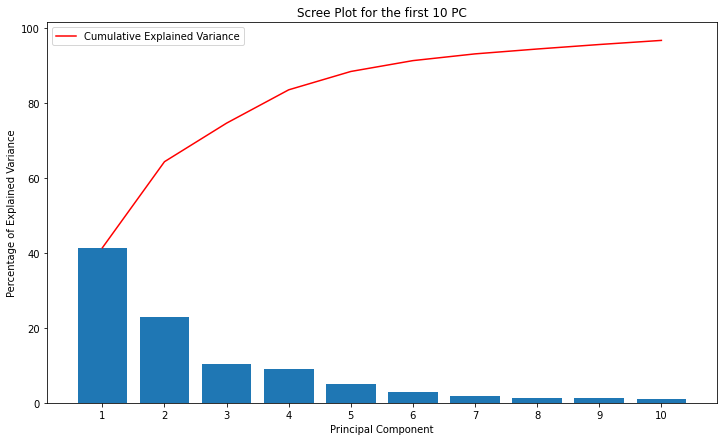

27    0.894134
19    0.230174
28   -0.217980
26   -0.207577
9    -0.106321
8     0.105045
18    0.088034
7     0.074913
20    0.074815
21    0.068051
dtype: float64
['STAI', 'SCOPA_TOTAL', 'UPSIT', 'SFT', 'HVLT_RECALL', 'GDS', 'RBDSQ', 'ESS', 'SCOPA_GASTRO', 'SCOPA_URINARY']


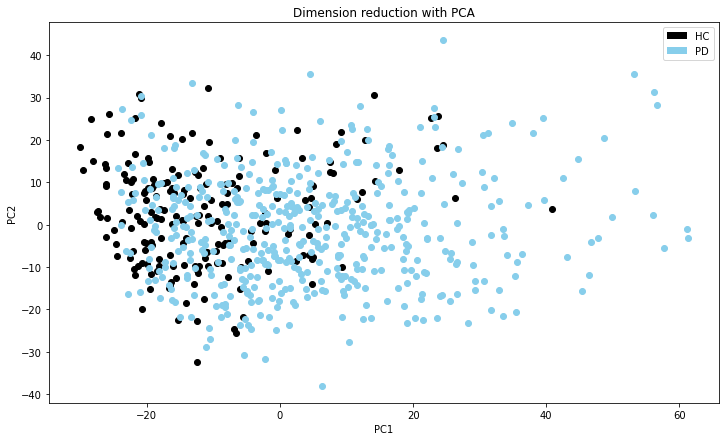

In [ ]:
my_PCA(clin_df1)

[39.8 20.6 12.4  7.9  5.   3.7  2.2  1.6  1.   1. ]


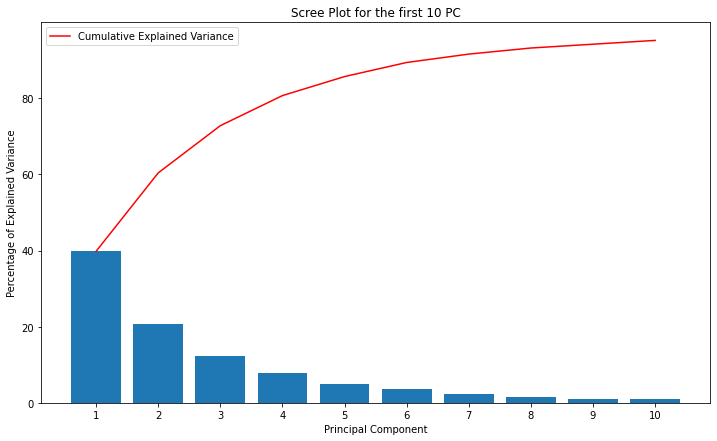

34    0.672858
7     0.476953
35   -0.274047
33   -0.228208
26    0.226045
6     0.203316
5     0.177457
16   -0.113819
4     0.098804
25    0.091587
dtype: float64
['STAI', 'MDS_UPDRS3', 'UPSIT', 'SFT', 'SCOPA_TOTAL', 'MDS_UPDRS2', 'MDS_UPDRS1', 'HVLT_RECALL', 'AGE', 'RBDSQ']


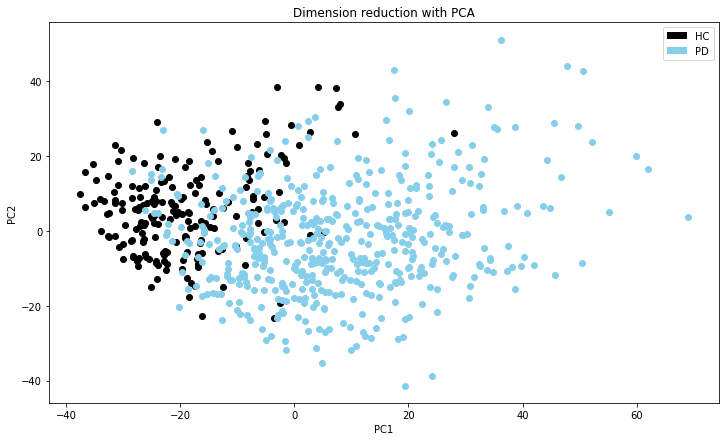

In [ ]:
my_PCA(clin_df2)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Number of HC 196
Number of PD 486


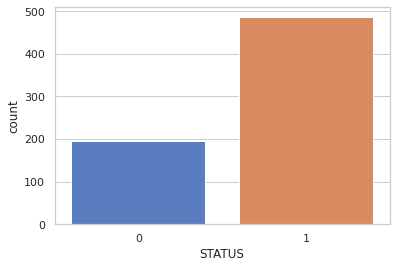

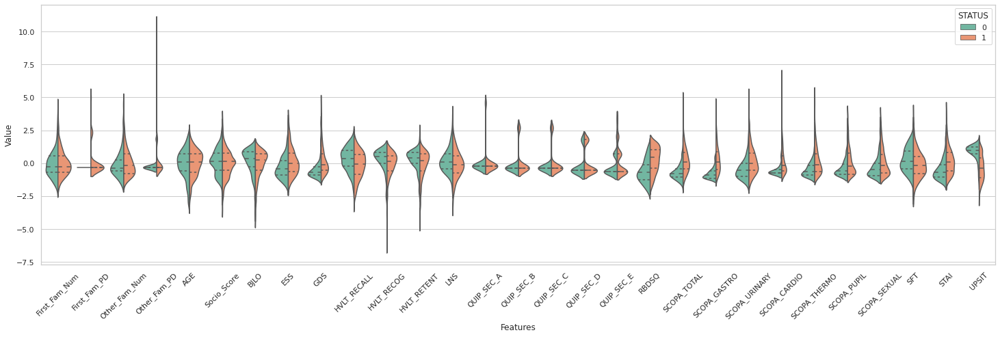

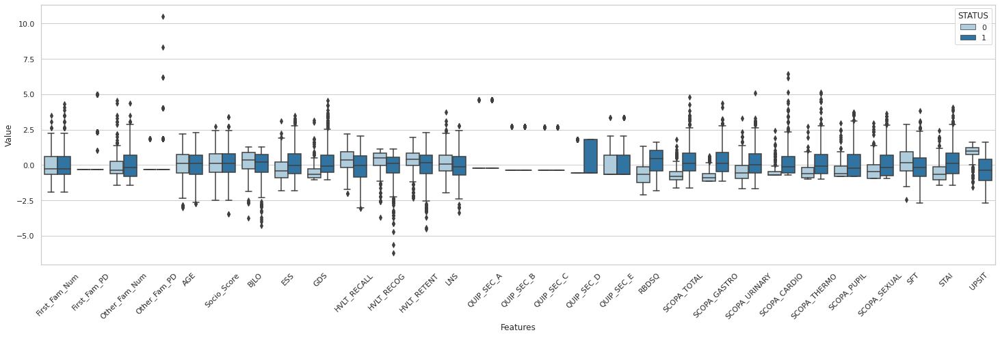

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning:

86.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning:

96.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning:

77.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning:

96.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning:

80.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.p

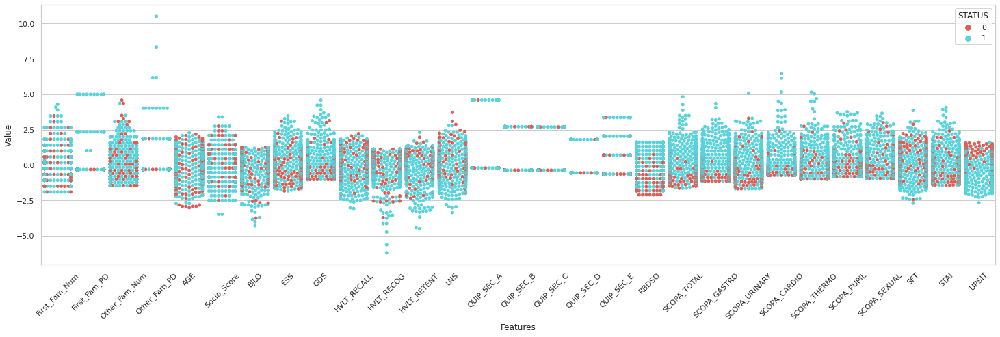

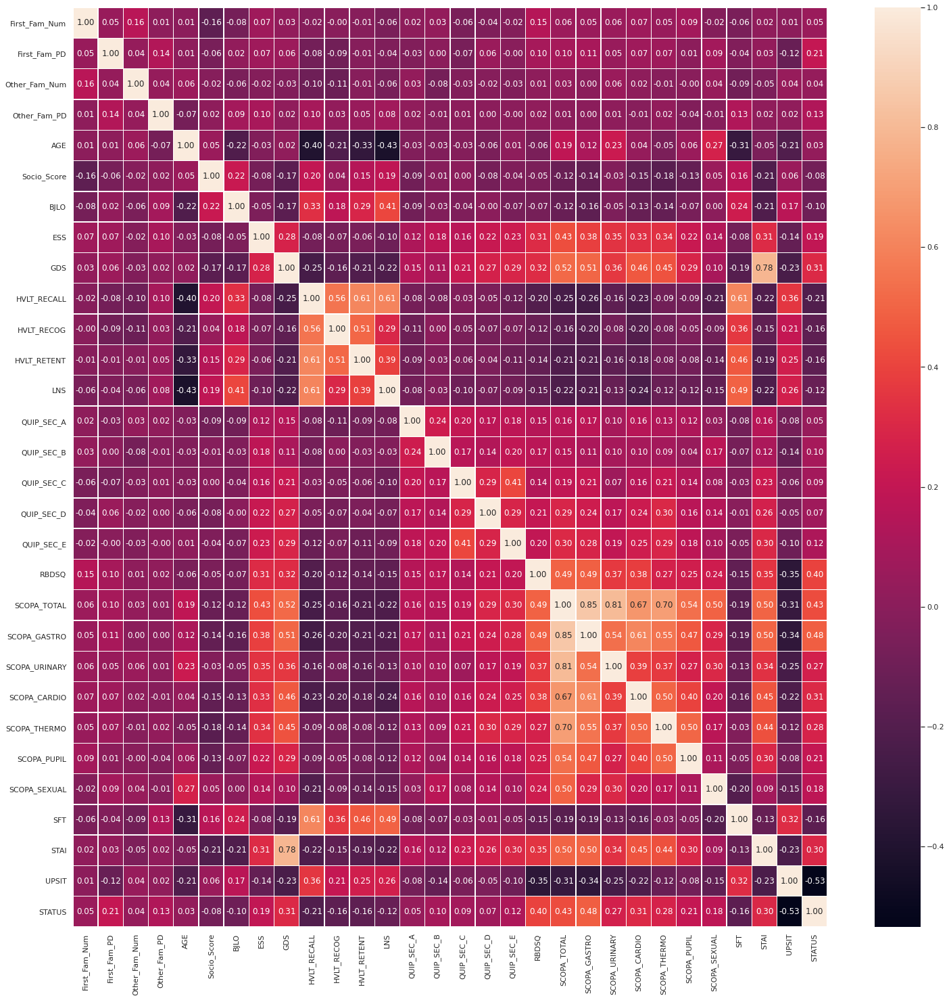

In [ ]:
SNS_Plots(clin_df1)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Number of HC 486
Number of PD 196
       First_Fam_Num  First_Fam_PD  ...        STAI       UPSIT
count     682.000000    682.000000  ...  682.000000  682.000000
mean        6.629032      0.121701  ...   63.253287   25.399560
std         2.414209      0.376238  ...   16.106766    9.135845
min         2.000000      0.000000  ...   40.000000    1.000000
25%         5.000000      0.000000  ...   50.678571   17.500000
50%         6.000000      0.000000  ...   61.000000   26.250000
75%         8.000000      0.000000  ...   72.333333   34.000000
max        17.000000      2.000000  ...  128.600000   40.000000

[8 rows x 36 columns]


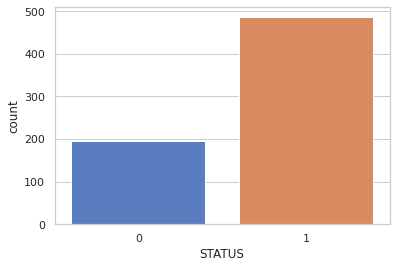

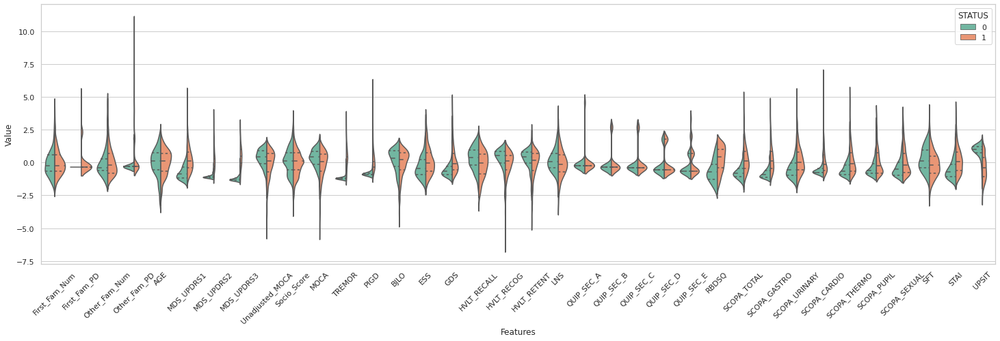

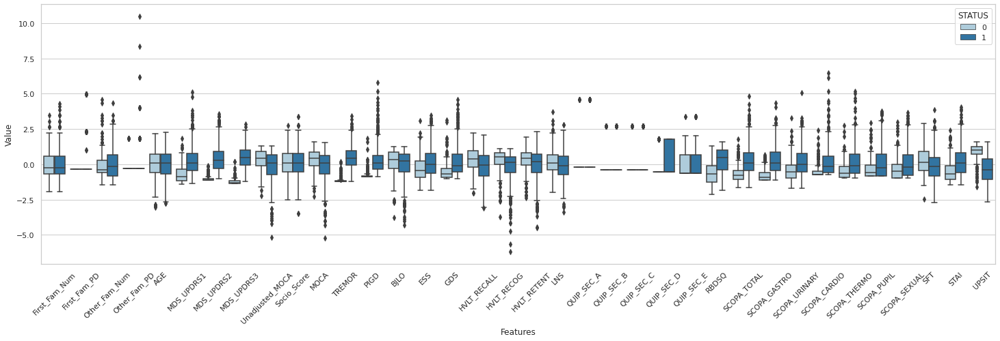

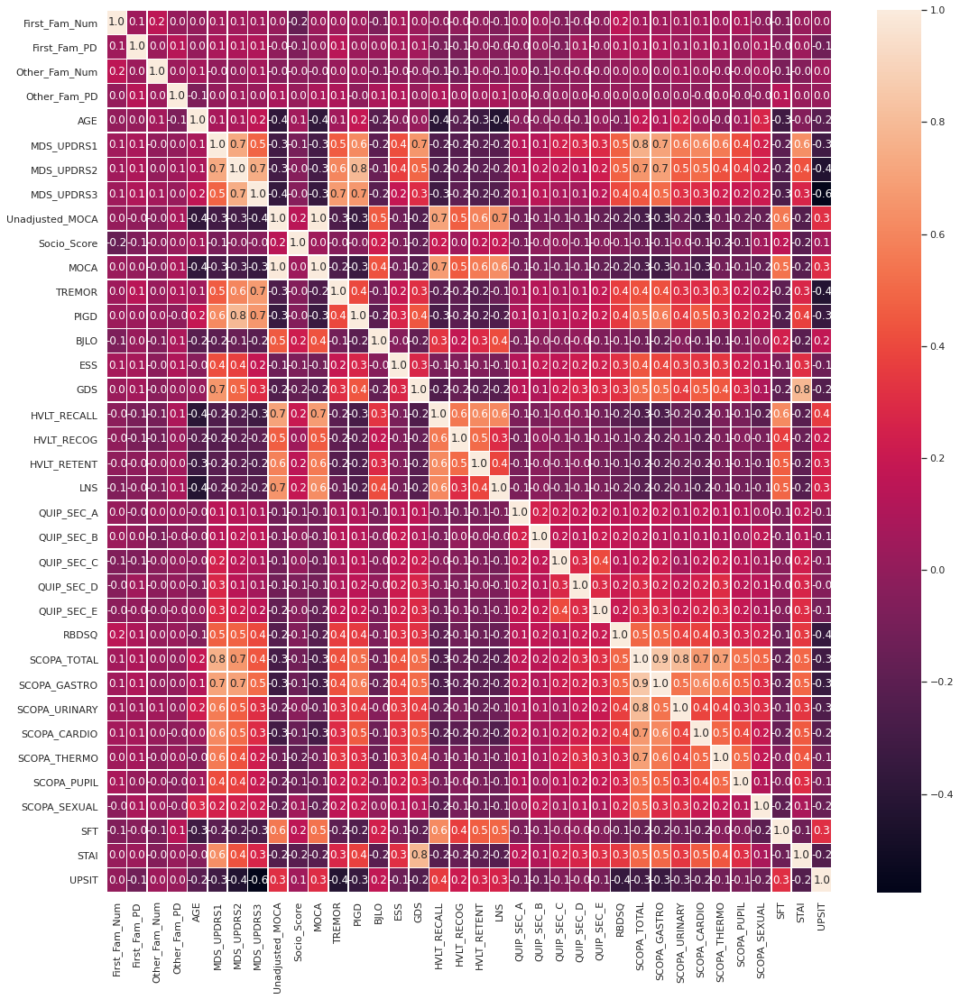

In [ ]:
SNS_Plots(df2)

# **Biospecimen Data**

---



In [ ]:
bios_df = pd.read_csv(location + "biospecimen_masterDB.csv", sep=",")
bios_df.head()

,PATNO,ABETA42,A_SYN,P_TAU,T_TAU,URATE,STATUS
0,3915.0,1119.375,1719.650,13.1200,158.350,237.000000,1
1,3914.0,614.150,1584.650,14.0825,174.325,270.285714,1
2,3838.0,746.900,1256.775,10.9825,137.050,234.571429,1
3,3819.0,612.020,1136.380,8.4880,109.100,231.875000,1
4,3900.0,511.280,1263.540,11.3980,145.260,400.666667,1


In [ ]:
bios_df.describe()

,PATNO,ABETA42,A_SYN,P_TAU,T_TAU,URATE,STATUS
count,641.000000,641.000000,641.000000,641.000000,641.000000,641.000000,641.000000
mean,3548.059282,958.929193,1614.194117,15.743820,182.250321,312.346414,0.711388
std,333.080236,384.540506,623.459915,6.647001,65.044348,73.518711,0.453471
min,3000.000000,249.566667,506.160000,8.050000,87.040000,0.000000,0.000000
25%,3269.000000,699.820000,1181.720000,11.342500,136.620000,261.000000,0.000000
50%,3523.000000,909.666667,1488.625000,13.987500,167.220000,309.333333,1.000000
75%,3820.000000,1126.040000,1889.400000,18.280000,213.300000,358.000000,1.000000
max,4139.000000,3077.000000,4261.633333,76.334000,582.900000,654.500000,1.000000


[84.1 14.7  1.   0.2  0. ]


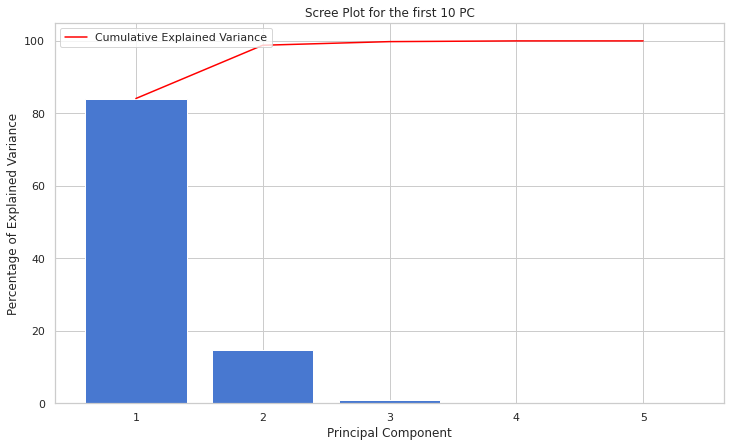

1    0.903000
0    0.422309
3    0.078577
2    0.007704
4   -0.003360
dtype: float64
['A_SYN', 'ABETA42', 'T_TAU', 'P_TAU', 'URATE']


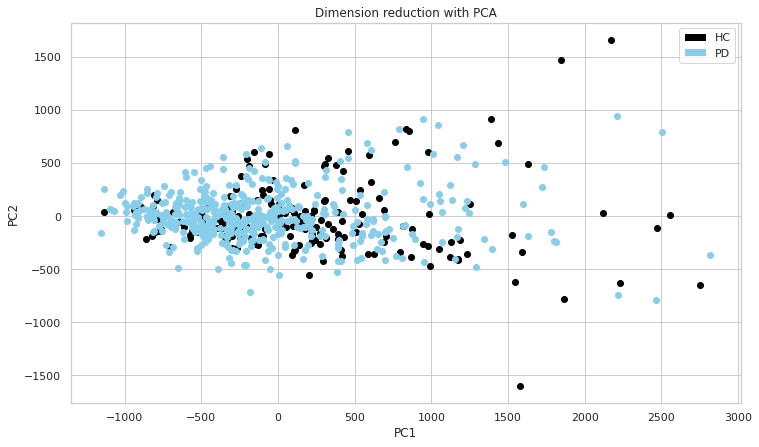

In [ ]:
my_PCA(bios_df)

Number of HC 185
Number of PD 456


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



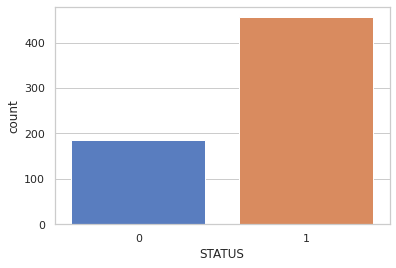

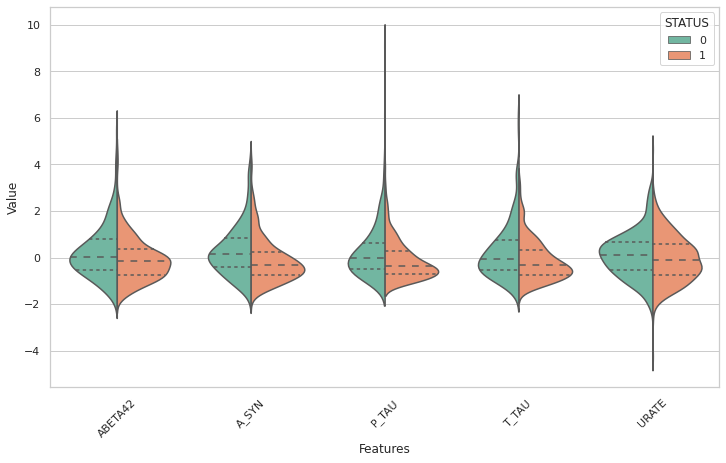

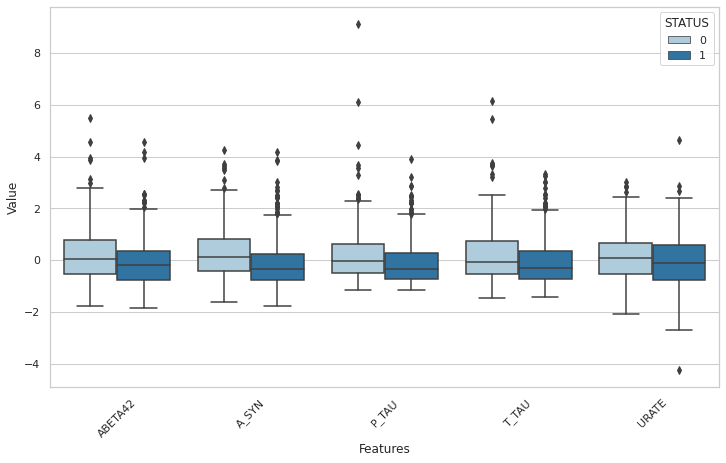

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning:

43.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning:

50.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning:

45.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning:

38.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



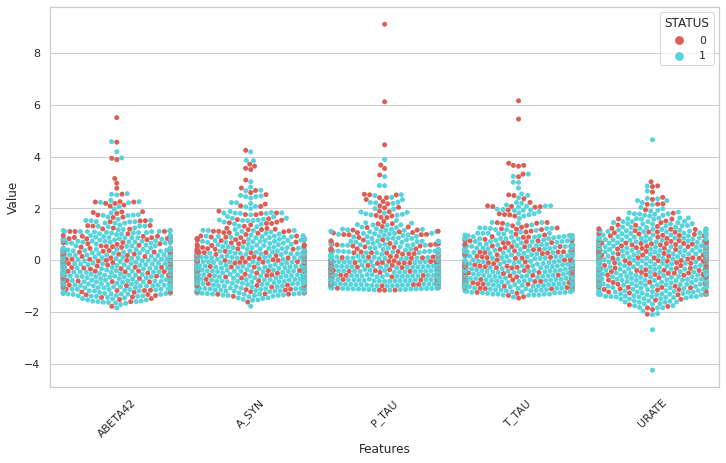

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning

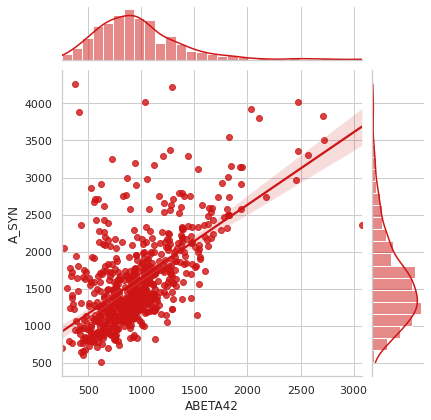

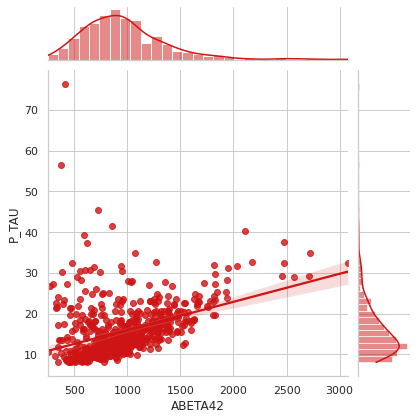

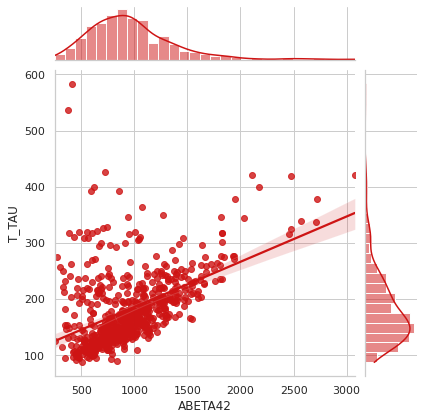

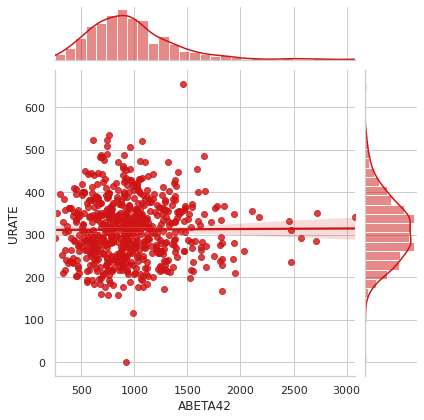

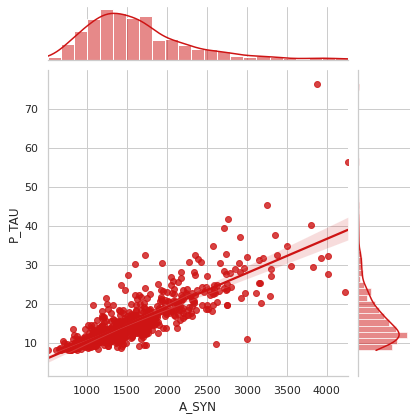

...

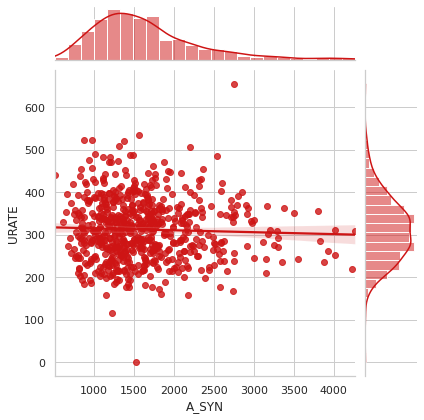

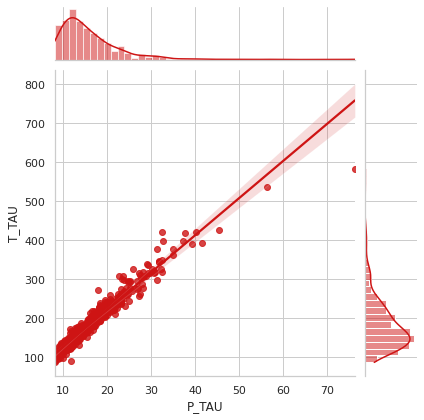

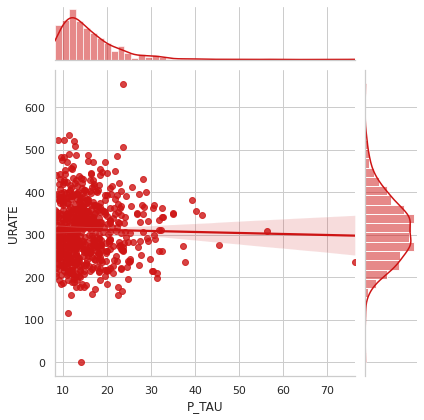

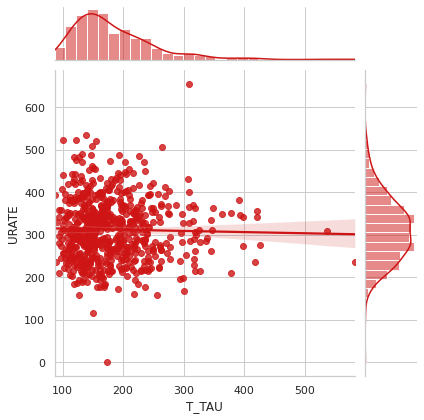

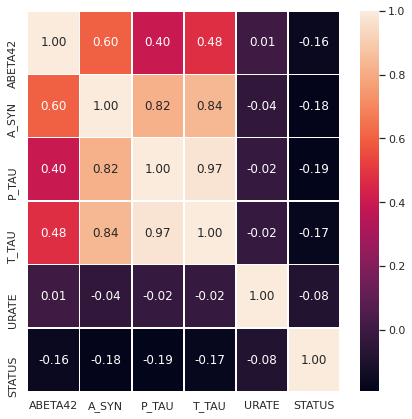

In [ ]:
SNS_Plots(bios_df)

# **Genetic Data** 

---



In [ ]:
gene_df = pd.read_csv(location + "snp_masterDB.csv", sep=",")
gene_df.head(5)

,PATNO,chr1_205739192_T_C,chr4_90753960_C_T,chr4_90756421_G_C,chr4_90760221_A_C,chr4_90760828_C_T,chr12_40761931_A_C,chr16_29826538_T_C,chr1_17313454_G_A,chr1_17314702_C_T,chr1_20977221_A_T,chr1_20977365_C_G,chr1_20977449_G_T,chr1_20978058_G_A,chr1_151668982_G_T,chr1_155829360_C_A,chr1_155837865_G_C,chr1_155838267_T_C,chr1_155852123_C_T,chr1_156040310_A_G,chr1_165171677_T_C,chr1_165171712_G_A,chr1_165172158_T_A,chr1_165173216_A_G,chr1_165218679_C_T,chr1_205737450_T_C,chr1_205737956_G_C,chr1_205738166_T_C,chr1_205738251_C_A,chr1_205738843_C_T,chr1_205739200_C_T,chr1_205744546_C_A,chr1_205797413_G_T,chr1_205801872_A_G,chr1_205810947_C_T,chr1_205812912_A_G,chr1_205814497_T_C,chr1_205814695_A_G,chr1_205819104_G_A,chr1_227071525_C_T,...,chr1_165171518_C_T,chr1_165172178_A_G,chr1_205738081_C_T,chr1_205797303_C_T,chr1_205801877_C_T,chr4_90648592_C_T,chr4_90663574_G_T,chr9_27548405_C_T,chr9_35059509_C_T,chr12_123338759_G_A,chr12_123344630_G_A,chr12_123346710_C_T,chr12_123347393_C_A,chr14_55310058_C_T,chr20_57016170_A_G,chr20_57020907_G_A,chrX_40450602_G_A,chrX_40465004_T_C,chr1_151670707_C_T,chr4_90656902_C_T,chr8_126095526_T_C,chr17_44102710_G_A,chr5_1443136_A_G,chr6_109003148_G_A,chr9_136509351_C_T,chr11_65620837_G_C,chr11_77926436_C_T,chr11_77928302_T_C,chr11_77929260_T_C,chr11_77929621_G_T,chr11_77936215_C_T,chr12_40643656_C_T,chr12_40681396_A_T,chr14_35031485_G_A,chr15_64418409_G_A,chrX_119603162_C_A,chr1_180944619_A_G,chr3_113850098_C_T,chr8_126094065_C_T,STATUS
0,3627,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3509,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,3214,1,0,0,0,0,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,1,1,1,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,3556,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,0,0,1,1,0,0,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,3367,1,1,1,1,1,0,1,0,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,1,1,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
file = open(location + "feaSel_xgb.txt", "r")
retain_list = []
counter = 0
for line in file:
  counter +=1
  if(counter > 0):
    retain_list.append(line[:-1])

print(len(retain_list))

93


In [ ]:
all_columns = gene_df.columns
drop_list = []
for i in all_columns:
  if(i not in retain_list and i != "STATUS" and i!= "PATNO"):
    drop_list.append(i)

gene_df = gene_df.drop(columns = drop_list, axis = 1)
gene_df.head()

,PATNO,chr4_90753960_C_T,chr1_20977449_G_T,chr1_20978058_G_A,chr4_90636708_T_C,chr4_90637010_A_G,chr4_90637601_G_A,chr4_90641340_T_C,chr4_90642464_A_T,chr4_90643757_C_G,chr4_90646886_G_A,chr4_90649290_C_G,chr4_90668419_C_A,chr4_90671069_A_G,chr4_90678541_G_A,chr4_90682571_A_G,chr4_90703233_A_G,chr4_90707947_T_C,chr4_90709232_A_T,chr4_90711770_T_C,chr4_90721637_C_G,chr4_90727088_C_T,chr4_90730687_C_A,chr4_90736006_A_C,chr4_90736517_T_C,chr4_90737327_G_A,chr4_90739539_C_A,chr4_90741519_G_A,chr4_90741773_A_G,chr4_90743331_C_T,chr4_90748195_T_A,chr4_90754313_C_T,chr4_90755939_A_G,chr4_90757294_A_C,chr4_90757394_G_C,chr4_90759047_G_T,chr4_90760883_C_T,chr4_90763260_A_G,chr4_90763360_C_A,chr4_90765052_C_T,...,chr17_44061023_G_A,chr17_44061036_T_C,chr17_44067400_T_C,chr17_44073889_A_G,chr17_44091724_G_A,chr17_44101871_A_G,chr17_44102638_A_G,chr17_44102865_A_C,chr1_20972111_G_A,chr1_20978024_C_A,chr4_90690939_G_T,chr4_90697979_T_C,chr4_90753180_A_G,chr4_90755239_G_A,chr4_90761357_T_A,chr4_90764310_T_C,chr5_122165828_T_C,chr12_105504953_T_C,chr17_44060775_C_T,chr1_20977599_C_G,chr4_90761054_C_A,chr4_90703753_T_C,chr4_90712629_T_C,chr4_90713259_G_A,chr5_122111005_G_T,chr6_109002518_A_G,chr4_90675238_A_G,chr4_90683990_T_C,chr4_90695508_G_A,chr4_90719196_A_T,chr4_90742692_A_G,chr4_90742815_G_A,chr4_90742861_T_G,chr4_90744216_G_A,chr4_90752205_T_C,chr6_109004379_C_T,chr17_44051846_A_G,chr4_90758389_G_C,chr10_47915898_A_G,STATUS
0,3627,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3509,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,3214,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,1,1,1,1,1,0,1,0,1,1,0,1,1,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,3556,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,3367,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,1,0,0,0,1,1,0,0,1,1,1,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


[21.4 13.  12.6 10.8  5.3  4.8  3.4  3.2  2.1  1.9]


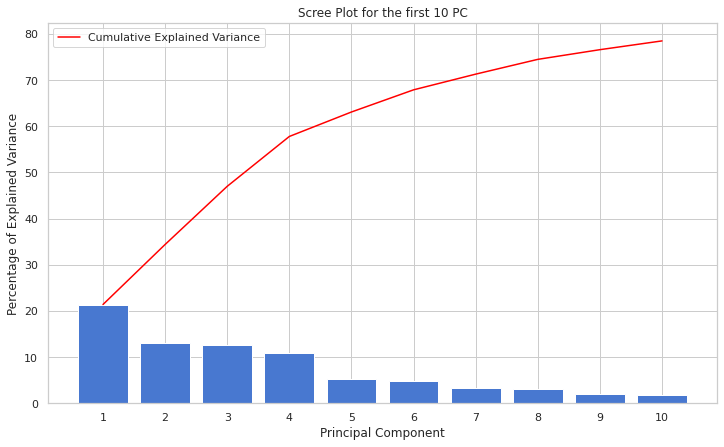

0     0.216737
26    0.215819
31    0.215337
34    0.214072
36    0.213603
19    0.213224
16    0.213162
39    0.212094
21   -0.197559
23   -0.196397
dtype: float64
['chr4_90753960_C_T', 'chr4_90741519_G_A', 'chr4_90755939_A_G', 'chr4_90759047_G_T', 'chr4_90763260_A_G', 'chr4_90721637_C_G', 'chr4_90707947_T_C', 'chr4_90767095_A_C', 'chr4_90730687_C_A', 'chr4_90736517_T_C']


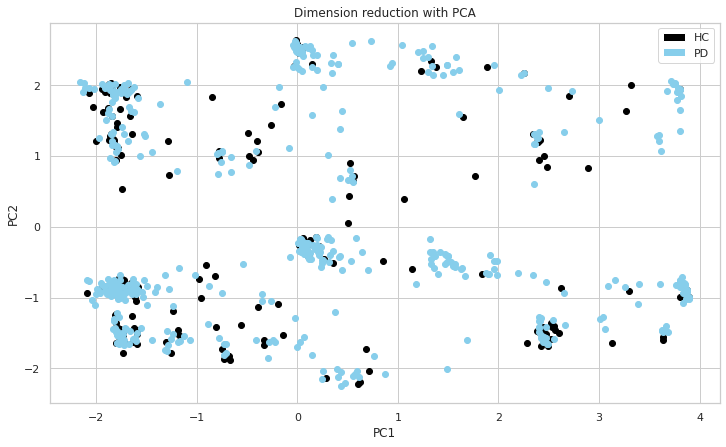

In [ ]:
my_PCA(gene_df)

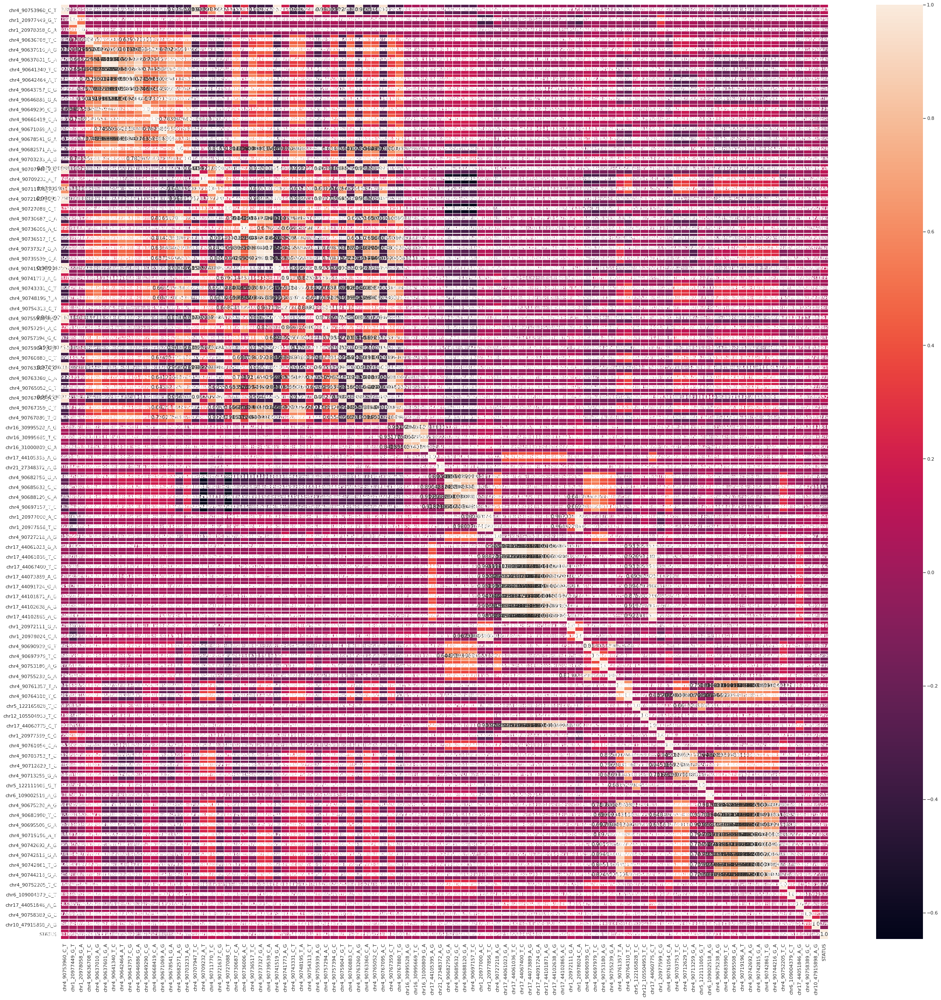

In [ ]:
SNS_Plots(gene_df)

# **Merging the 3 datasets**

---



In [ ]:
dfs = [clin_df1, bios_df, gene_df]
nan_value = 0

merge_df = reduce(lambda  left,right: pd.merge(left,right,on=['PATNO'],
                                            how='outer'), dfs).fillna(nan_value)

merge_df = merge_df.drop(columns=["STATUS_x", "STATUS_y"], axis= 1)

merge_df.head()

,PATNO,First_Fam_Num,First_Fam_PD,Other_Fam_Num,Other_Fam_PD,AGE,Socio_Score,BJLO,ESS,GDS,HVLT_RECALL,HVLT_RECOG,HVLT_RETENT,LNS,QUIP_SEC_A,QUIP_SEC_B,QUIP_SEC_C,QUIP_SEC_D,QUIP_SEC_E,RBDSQ,SCOPA_TOTAL,SCOPA_GASTRO,SCOPA_URINARY,SCOPA_CARDIO,SCOPA_THERMO,SCOPA_PUPIL,SCOPA_SEXUAL,SFT,STAI,UPSIT,ABETA42,A_SYN,P_TAU,T_TAU,URATE,chr4_90753960_C_T,chr1_20977449_G_T,chr1_20978058_G_A,chr4_90636708_T_C,chr4_90637010_A_G,...,chr17_44061023_G_A,chr17_44061036_T_C,chr17_44067400_T_C,chr17_44073889_A_G,chr17_44091724_G_A,chr17_44101871_A_G,chr17_44102638_A_G,chr17_44102865_A_C,chr1_20972111_G_A,chr1_20978024_C_A,chr4_90690939_G_T,chr4_90697979_T_C,chr4_90753180_A_G,chr4_90755239_G_A,chr4_90761357_T_A,chr4_90764310_T_C,chr5_122165828_T_C,chr12_105504953_T_C,chr17_44060775_C_T,chr1_20977599_C_G,chr4_90761054_C_A,chr4_90703753_T_C,chr4_90712629_T_C,chr4_90713259_G_A,chr5_122111005_G_T,chr6_109002518_A_G,chr4_90675238_A_G,chr4_90683990_T_C,chr4_90695508_G_A,chr4_90719196_A_T,chr4_90742692_A_G,chr4_90742815_G_A,chr4_90742861_T_G,chr4_90744216_G_A,chr4_90752205_T_C,chr6_109004379_C_T,chr17_44051846_A_G,chr4_90758389_G_C,chr10_47915898_A_G,STATUS
0,3000,5.0,0.0,12.0,0.0,69.0,18.0,14.250000,5.000000,0.500000,28.125,9.125000,0.917647,11.875000,0.0,0.0,0.0,0.0,0.0,2.0,6.125000,0.625000,3.750000,0.000000,0.000000,0.000000,1.750000,56.500000,60.625000,35.0,1078.833333,1728.766667,18.6500,217.800,275.250000,0.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3001,6.0,0.0,15.5,0.0,65.0,16.0,14.250000,5.888889,1.666667,26.875,10.125000,1.012658,15.125000,0.0,1.0,0.0,0.0,1.0,12.0,15.444444,2.555556,6.888889,0.555556,1.000000,0.111111,4.333333,46.875000,61.666667,21.0,987.280000,1412.600000,14.8580,174.420,278.600000,1.0,1.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,3002,6.0,0.0,16.0,0.0,67.0,16.0,12.625000,13.666667,5.333333,25.875,9.500000,1.012346,10.500000,0.0,0.0,0.0,1.0,2.0,11.0,24.555556,8.111111,7.777778,0.222222,4.666667,2.555556,1.222222,46.125000,79.222222,14.5,553.600000,2667.400000,30.4725,318.400,215.200000,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,3003,4.0,0.0,6.0,0.0,56.0,16.0,13.375000,7.333333,1.111111,26.125,11.375000,0.896552,9.125000,0.0,0.0,0.0,1.0,0.0,8.0,15.555556,2.666667,9.888889,1.777778,0.888889,0.222222,0.111111,46.875000,47.111111,18.5,753.640000,814.240000,8.9880,109.200,219.166667,1.0,0.0,0.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,3004,5.0,0.0,8.0,0.0,59.0,16.0,14.142857,8.285714,1.000000,21.000,11.571429,0.750000,11.285714,0.0,0.0,0.0,0.0,1.0,3.0,6.571429,1.571429,2.857143,0.000000,0.714286,0.000000,1.428571,53.571429,54.285714,37.5,898.875000,1014.775000,10.2075,116.795,423.600000,0.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
merge_df2 = reduce(lambda  left,right: pd.merge(left,right,on=['PATNO'],
                                            how='inner'), dfs).fillna(nan_value)

merge_df2 = merge_df2.drop(columns=["STATUS_x", "STATUS_y"], axis= 1)

merge_df2.head()

,PATNO,First_Fam_Num,First_Fam_PD,Other_Fam_Num,Other_Fam_PD,AGE,Socio_Score,BJLO,ESS,GDS,HVLT_RECALL,HVLT_RECOG,HVLT_RETENT,LNS,QUIP_SEC_A,QUIP_SEC_B,QUIP_SEC_C,QUIP_SEC_D,QUIP_SEC_E,RBDSQ,SCOPA_TOTAL,SCOPA_GASTRO,SCOPA_URINARY,SCOPA_CARDIO,SCOPA_THERMO,SCOPA_PUPIL,SCOPA_SEXUAL,SFT,STAI,UPSIT,ABETA42,A_SYN,P_TAU,T_TAU,URATE,chr4_90753960_C_T,chr1_20977449_G_T,chr1_20978058_G_A,chr4_90636708_T_C,chr4_90637010_A_G,...,chr17_44061023_G_A,chr17_44061036_T_C,chr17_44067400_T_C,chr17_44073889_A_G,chr17_44091724_G_A,chr17_44101871_A_G,chr17_44102638_A_G,chr17_44102865_A_C,chr1_20972111_G_A,chr1_20978024_C_A,chr4_90690939_G_T,chr4_90697979_T_C,chr4_90753180_A_G,chr4_90755239_G_A,chr4_90761357_T_A,chr4_90764310_T_C,chr5_122165828_T_C,chr12_105504953_T_C,chr17_44060775_C_T,chr1_20977599_C_G,chr4_90761054_C_A,chr4_90703753_T_C,chr4_90712629_T_C,chr4_90713259_G_A,chr5_122111005_G_T,chr6_109002518_A_G,chr4_90675238_A_G,chr4_90683990_T_C,chr4_90695508_G_A,chr4_90719196_A_T,chr4_90742692_A_G,chr4_90742815_G_A,chr4_90742861_T_G,chr4_90744216_G_A,chr4_90752205_T_C,chr6_109004379_C_T,chr17_44051846_A_G,chr4_90758389_G_C,chr10_47915898_A_G,STATUS
0,3000,5.0,0.0,12.0,0,69,18,14.250000,5.000000,0.500000,28.125,9.125000,0.917647,11.875000,0,0,0,0,0,2,6.125000,0.625000,3.750000,0.000000,0.000000,0.000000,1.750000,56.500000,60.625000,35.0,1078.833333,1728.766667,18.6500,217.800,275.250000,0,1,1,1,1,...,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3001,6.0,0.0,15.5,0,65,16,14.250000,5.888889,1.666667,26.875,10.125000,1.012658,15.125000,0,1,0,0,1,12,15.444444,2.555556,6.888889,0.555556,1.000000,0.111111,4.333333,46.875000,61.666667,21.0,987.280000,1412.600000,14.8580,174.420,278.600000,1,1,1,0,0,...,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,3002,6.0,0.0,16.0,0,67,16,12.625000,13.666667,5.333333,25.875,9.500000,1.012346,10.500000,0,0,0,1,2,11,24.555556,8.111111,7.777778,0.222222,4.666667,2.555556,1.222222,46.125000,79.222222,14.5,553.600000,2667.400000,30.4725,318.400,215.200000,1,1,1,1,1,...,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,3003,4.0,0.0,6.0,0,56,16,13.375000,7.333333,1.111111,26.125,11.375000,0.896552,9.125000,0,0,0,1,0,8,15.555556,2.666667,9.888889,1.777778,0.888889,0.222222,0.111111,46.875000,47.111111,18.5,753.640000,814.240000,8.9880,109.200,219.166667,1,0,0,1,1,...,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,3004,5.0,0.0,8.0,0,59,16,14.142857,8.285714,1.000000,21.000,11.571429,0.750000,11.285714,0,0,0,0,1,3,6.571429,1.571429,2.857143,0.000000,0.714286,0.000000,1.428571,53.571429,54.285714,37.5,898.875000,1014.775000,10.2075,116.795,423.600000,0,1,1,1,1,...,1,1,1,0,1,1,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


[91.7  7.   1.1  0.1  0.1  0.   0.   0.   0.   0. ]


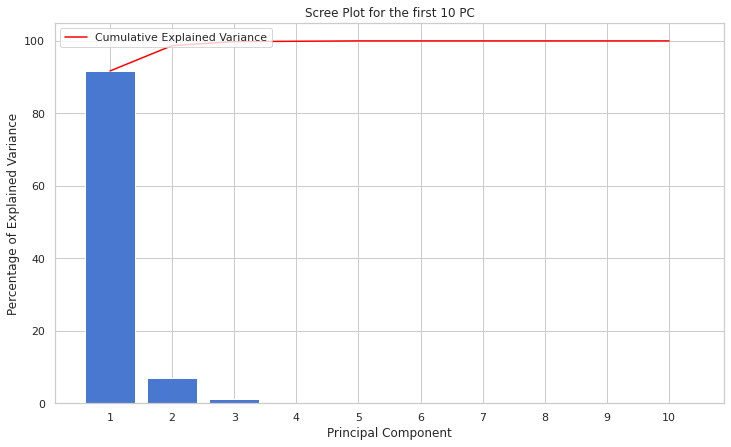

30    0.870394
29    0.474438
33    0.094607
32    0.088492
4     0.013221
27    0.011076
26    0.009279
31    0.008017
28    0.005771
9     0.004755
dtype: float64
['A_SYN', 'ABETA42', 'URATE', 'T_TAU', 'AGE', 'STAI', 'SFT', 'P_TAU', 'UPSIT', 'HVLT_RECALL']


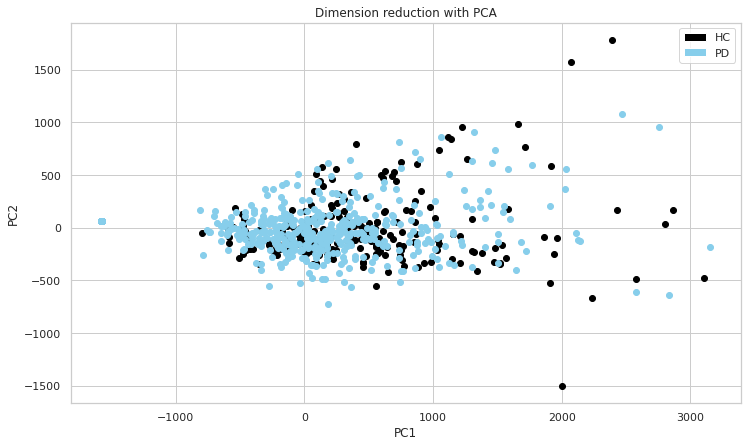

In [ ]:
my_PCA(merge_df)

[84.3 14.4  1.   0.2  0.1  0.   0.   0.   0.   0. ]


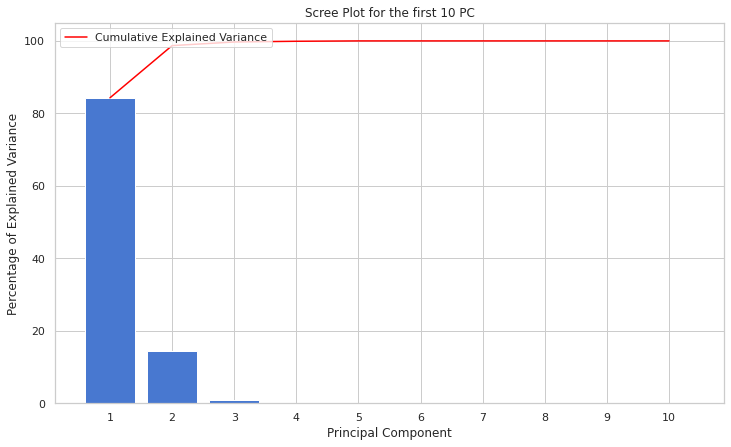

30    0.901281
29    0.425987
32    0.078245
31    0.007678
33   -0.005690
27   -0.002403
4     0.001899
28    0.001889
18   -0.000716
19   -0.000570
dtype: float64
['A_SYN', 'ABETA42', 'T_TAU', 'P_TAU', 'URATE', 'STAI', 'AGE', 'UPSIT', 'RBDSQ', 'SCOPA_TOTAL']


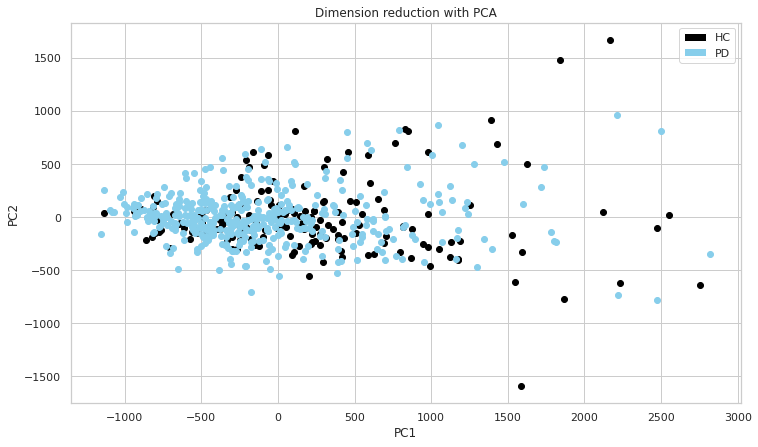

In [ ]:
my_PCA(merge_df2)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Number of HC 516
Number of PD 260
       First_Fam_Num  First_Fam_PD  ...  chr17_44103616_C_T  chr17_44104343_A_C
count     776.000000    776.000000  ...          776.000000          776.000000
mean        5.826031      0.106959  ...            0.340206            0.342784
std         3.131425      0.354915  ...            0.474084            0.474946
min         0.000000      0.000000  ...            0.000000            0.000000
25%         4.000000      0.000000  ...            0.000000            0.000000
50%         6.000000      0.000000  ...            0.000000            0.000000
75%         7.625000      0.000000  ...            1.000000            1.000000
max        17.000000      2.000000  ...            1.000000            1.000000

[8 rows x 58 columns]


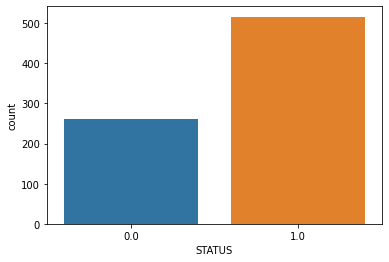

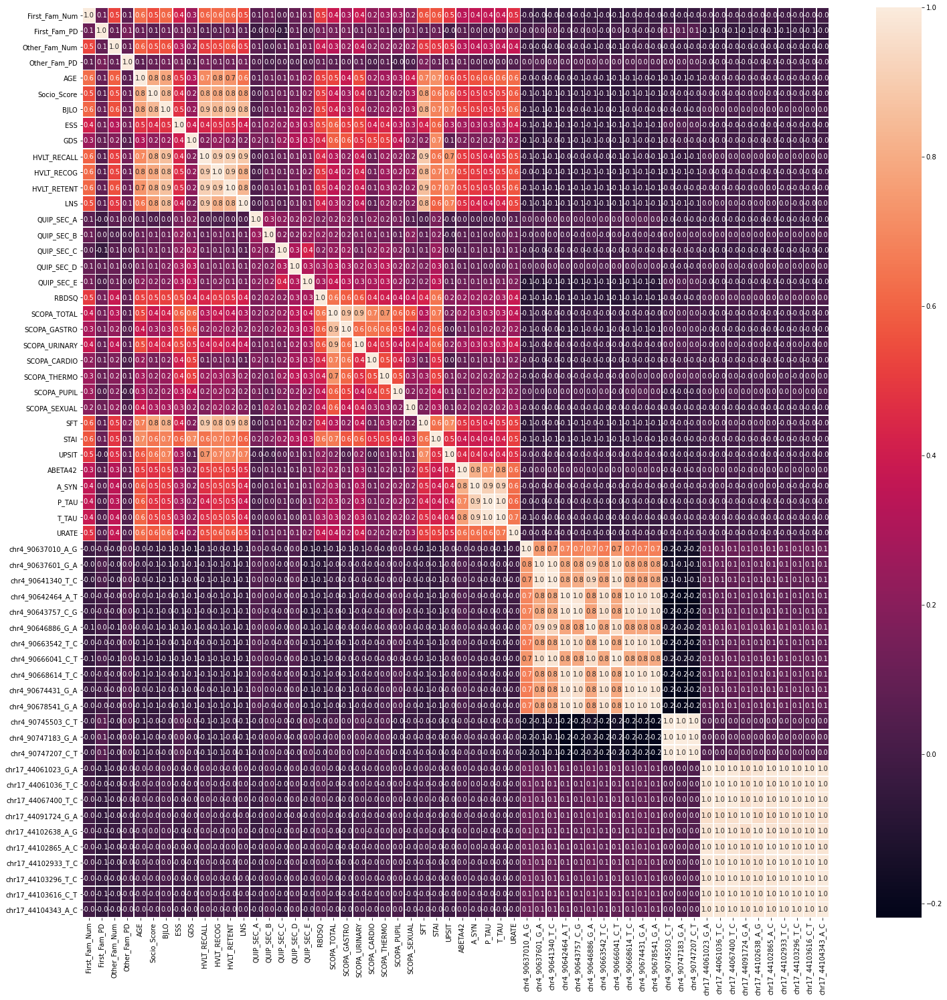

In [ ]:
SNS_Plots(merge_df)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Number of HC 427
Number of PD 171
       First_Fam_Num  First_Fam_PD  ...  chr17_44103616_C_T  chr17_44104343_A_C
count     598.000000    598.000000  ...          598.000000          598.000000
mean        6.697324      0.115385  ...            0.359532            0.362876
std         2.446142      0.358057  ...            0.480265            0.481232
min         2.000000      0.000000  ...            0.000000            0.000000
25%         5.000000      0.000000  ...            0.000000            0.000000
50%         6.000000      0.000000  ...            0.000000            0.000000
75%         8.000000      0.000000  ...            1.000000            1.000000
max        17.000000      2.000000  ...            1.000000            1.000000

[8 rows x 58 columns]


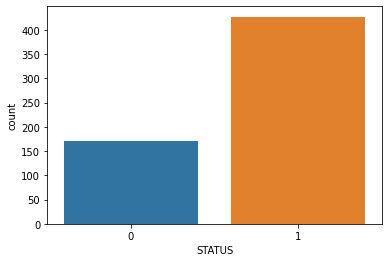

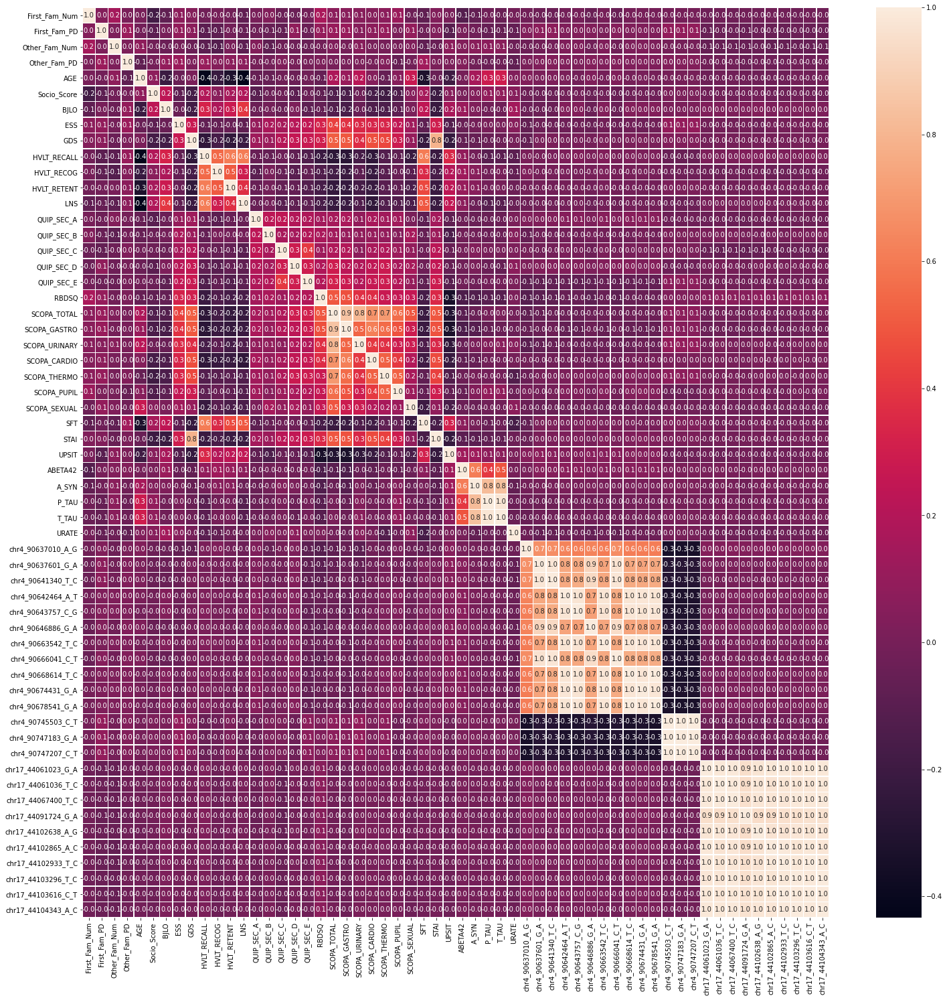

In [ ]:
SNS_Plots(merge_df2)